# PW 1 - Markovian models  
Sampling of Markovian models.

The aim of this session is to program the Gibbs sampler algorithm and study it in the binary case.

In this section we consider a binary Markov random field (taking values in $E=\{0,1\}$).
The neighborhood is defined in 4-connexity and the potential of a clique of order 2 is defined by :
$U_c(0,1)=U_c(1,0)=+\beta$ and $U_c(1,1)=U_c(0,0)=0$ (the potential for singleton clique is 0).


In [1]:
import math
import random
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
import imageio
from scipy import ndimage as ndi

In [3]:
plt.set_cmap('gray')

<Figure size 640x480 with 0 Axes>

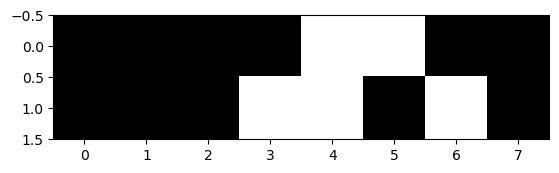

In [2]:
plt.set_cmap('gray')

sh=[2,8]

imaU=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaU)

#Q1
For the Ising model defined above, and the imaU generated in the previous cell, give the formula of the global energy and give its value as a function of $\beta$ for imaU.



#A1


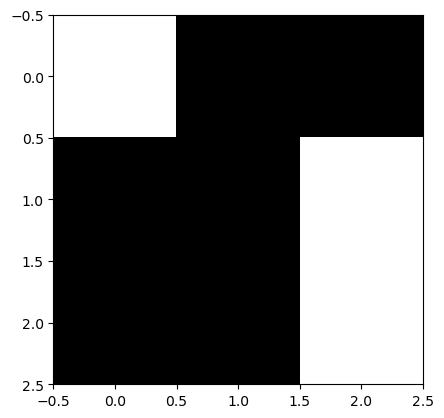

In [4]:
sh=[3,3]

imaVois=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaVois)

#Q2

Write the general form of the local conditional probability in a pixel $s$. For the neighborhood configuration imaVois generated by the previous code cell, compute the 2 local conditional energies (for the value 0 and for the value 1 of the central pixel), then the local conditional probabilities (as a function of $\beta$). What is the most probable class ? (NB: do the calculation for an 8-neighborhood).


#A2


In [6]:
def ising(s, v, b):
    """
    @param s: value of this point
    @param v: value of chosen neighboring point
    @param b: beta
    @return: value of these two neighbors
    """
    if s == v:
        return 0
    else:
        return b

In [7]:
def point_existence(n,m,i,j):
    if (i >= 0 and i < n) and (j >= 0 and j < m):
        return 1
    else:
        return 0

In [17]:
def point_energy_8_ising(image_binary, b, value):
    """
    to calculate the point-wise energy for conditional probability
    @param image_binary: an numpy array for binary image
    @param b: beta
    @param value: 0 or 1. Calculate the energy of value 0 or 1
    @return: array of the same shape as image_binary
    """
    res = np.empty_like(image_binary)
    n = image_binary.shape[0] # rows
    m = image_binary.shape[1] # columns
    for i in range(n):
        for j in range(m):
            point_res = 0
            if point_existence(n,m,i-1, j-1):
                point_res += ising(value, image_binary[i-1][j-1],b)
            if point_existence(n,m,i-1, j):
                point_res += ising(value, image_binary[i-1][j],b)
            if point_existence(n,m,i-1, j+1):
                point_res += ising(value, image_binary[i-1][j+1],b)
            if point_existence(n,m,i, j-1):
                point_res += ising(value, image_binary[i][j-1],b)
            if point_existence(n,m,i, j+1):
                point_res += ising(value, image_binary[i][j+1],b)
            if point_existence(n,m,i+1, j-1):
                point_res += ising(value, image_binary[i+1][j-1],b)
            if point_existence(n,m,i+1, j):
                point_res += ising(value, image_binary[i+1][j],b)
            if point_existence(n,m,i+1, j+1):
                point_res += ising(value, image_binary[i+1][j+1],b)
            res[i][j] = point_res
    return res                

In [22]:
def point_partition_8_ising(image_binary, b):
    value0 = point_energy_8_ising(image_binary, 0)
    value1 = point_energy_8_ising(image_binary, 1)
    res = np.exp(-value0)+np.exp(-value1)
    return res

## Part 1

Programming the Gibbs sampler and drawing samples of Markovian models



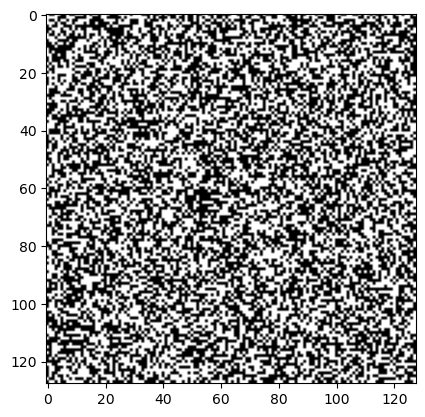

In [23]:
plt.set_cmap('gray')

sh=[128,128]

im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

### Sampling function
Complete the following function which takes as input a binary image (which will be updated by Gibbs sampling) and the value of the regularization parameter.


In [48]:
-1%3

2

In [25]:
# here we define 4 connectivity
def echan(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= ising(0, im_bin[i][j1],beta_reg) + ising(0, im_bin[i1][j],beta_reg) + ising(0, im_bin[i][j2],beta_reg) + ising(0, im_bin[i2][j],beta_reg)
            p0=math.exp(-Ureg0);

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= ising(1, im_bin[i][j1],beta_reg) + ising(1, im_bin[i1][j],beta_reg) + ising(1, im_bin[i][j2],beta_reg) + ising(1, im_bin[i2][j],beta_reg)
            p1=math.exp(-Ureg1);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0 # ?
                else :
                    im_bin[i,j]= 1 # ?

    return im_bin


By varying the value of the regularization parameter and restarting the cell, observe. You can remove the visualization during sampling and increase the number of iterations

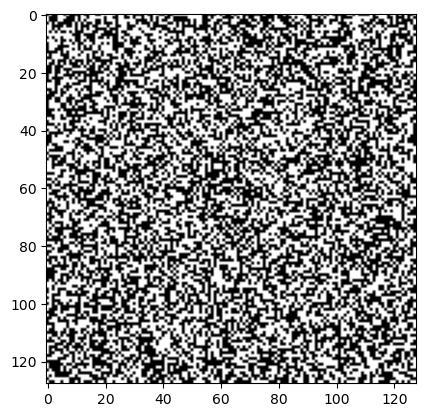

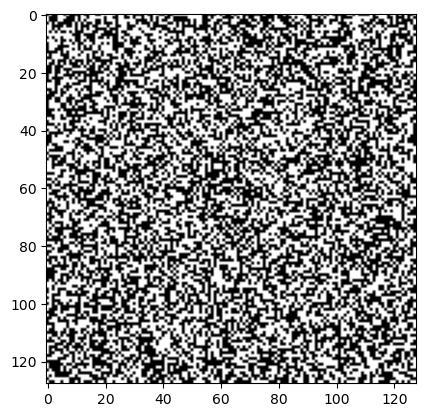

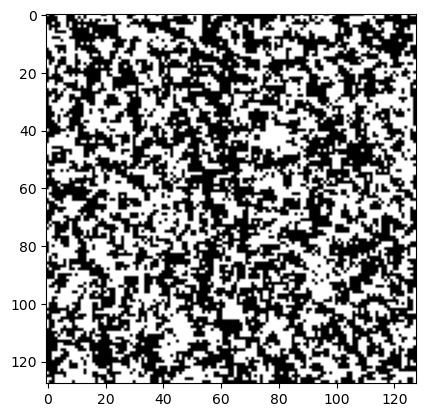

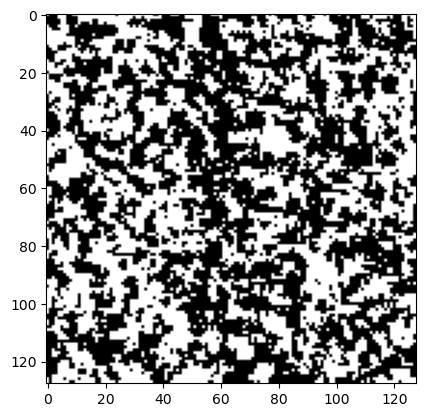

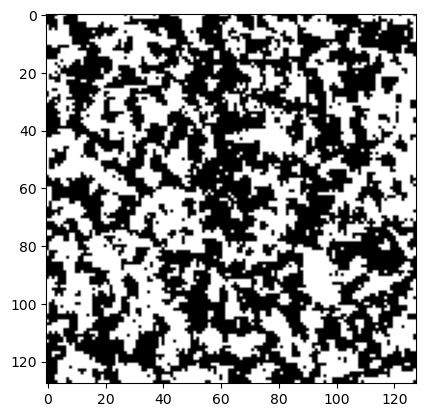

...

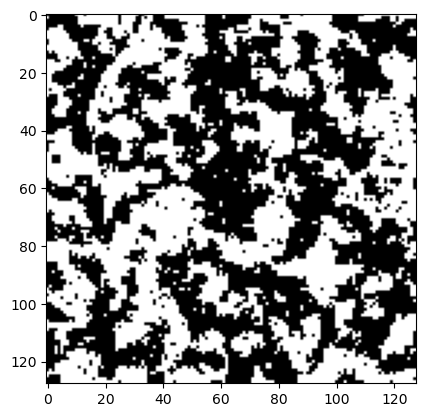

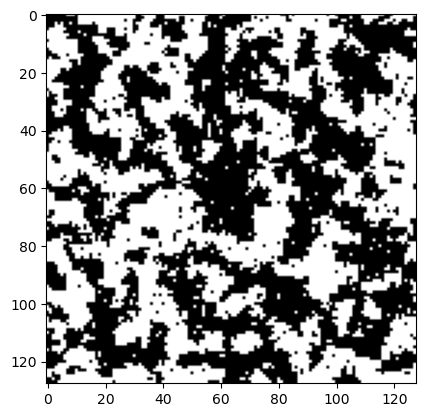

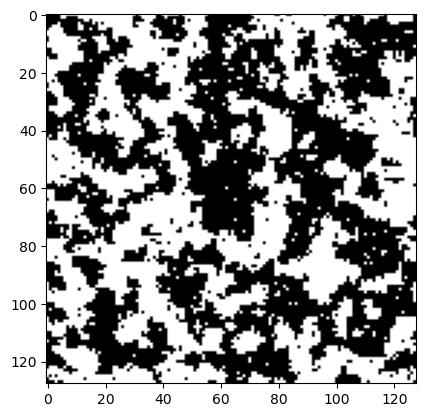

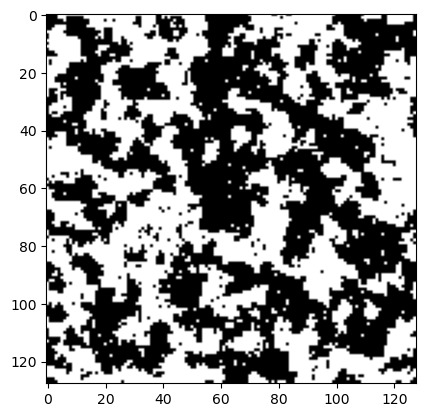

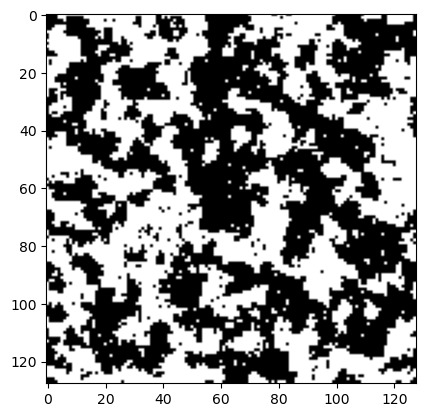

In [29]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg= 1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

#Q3
Run the program several times. Do you still get the same image? Comment on this.

#A3

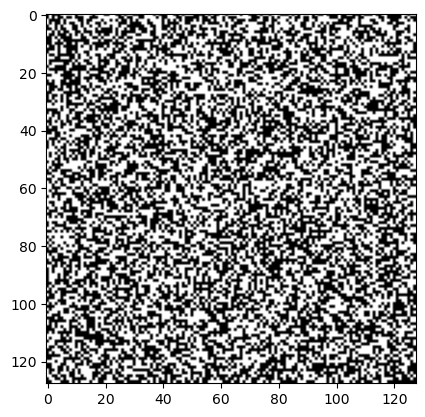

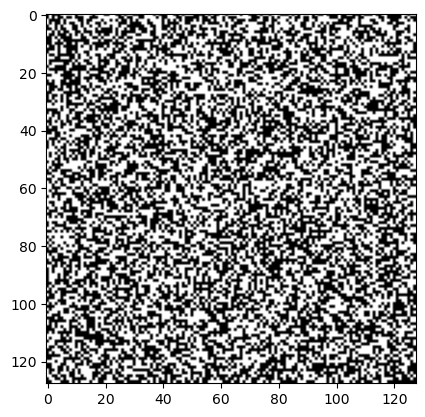

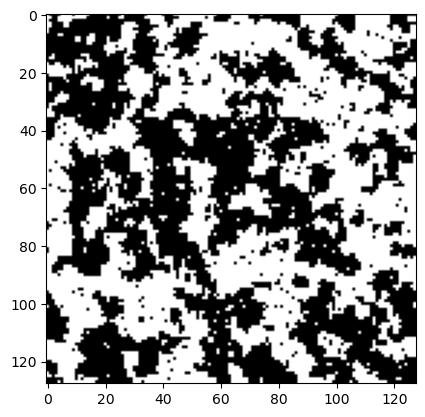

In [38]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
plt.imshow(im_bin)
beta_reg= 1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

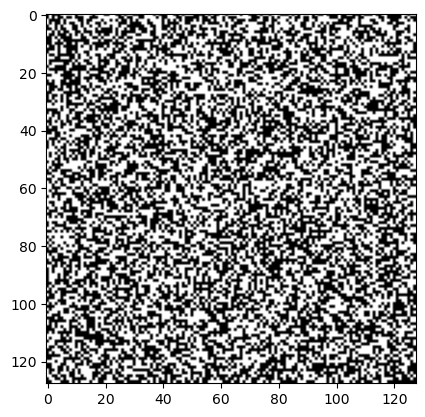

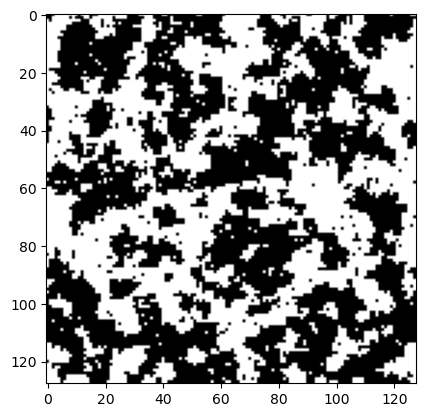

In [39]:
mafigure=plt.figure()
plt.imshow(im_bin_copy);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin_copy,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin_copy)
plt.show()

#Q4

Vary $\beta$ from 0.5 to 20. Comment on the results.

#A4

<Figure size 640x480 with 0 Axes>

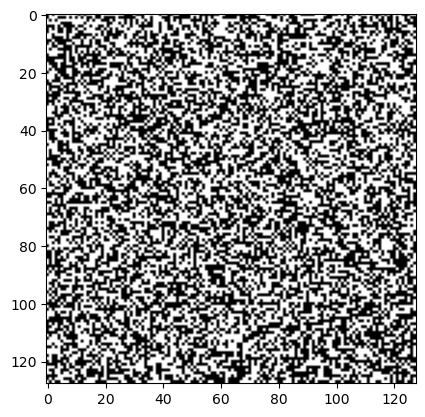

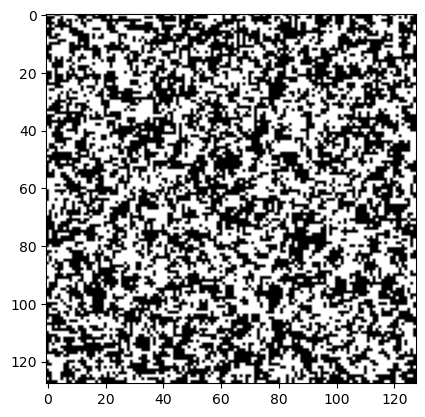

In [41]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= 0.5

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

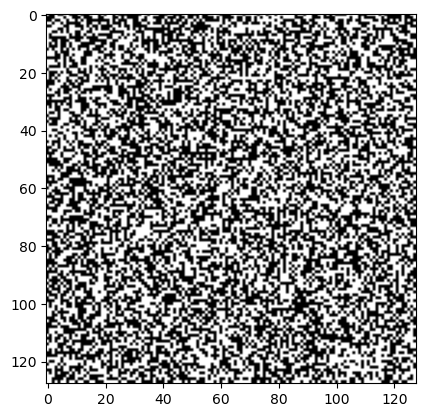

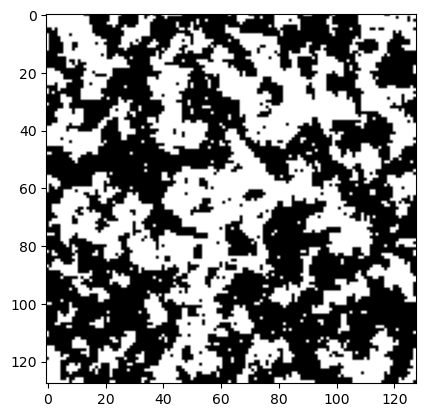

In [45]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= 1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

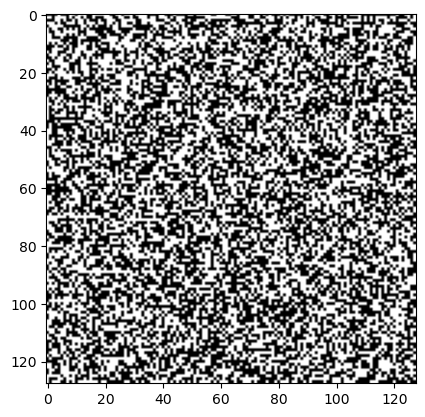

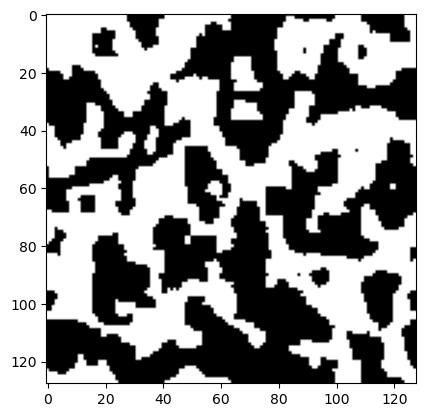

In [42]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= 2

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

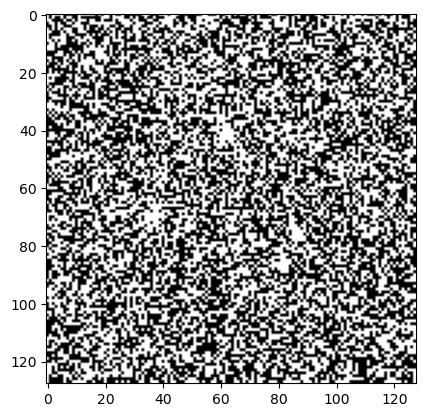

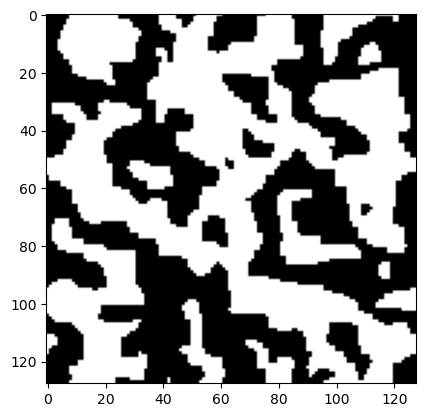

In [46]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= 5

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

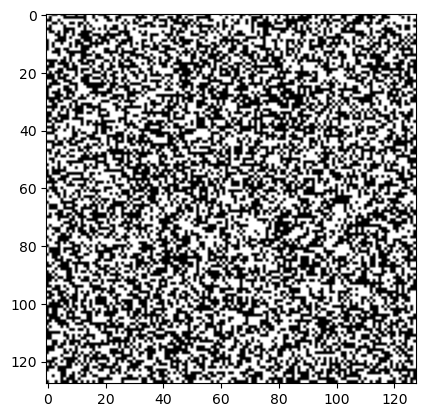

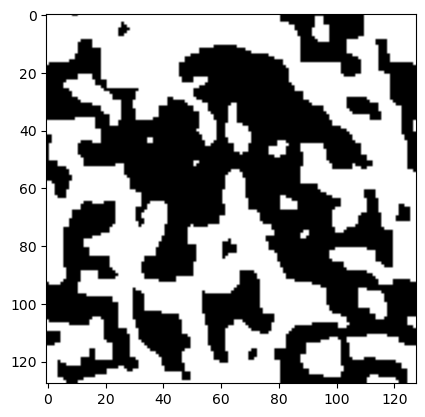

In [44]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= 10

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

<Figure size 640x480 with 0 Axes>

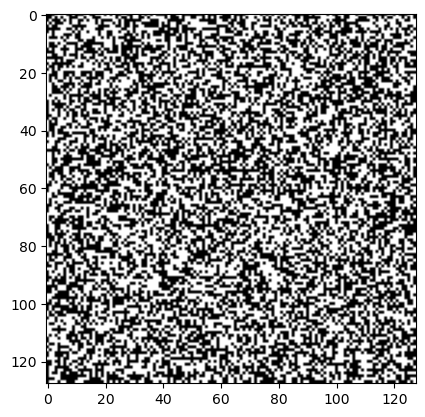

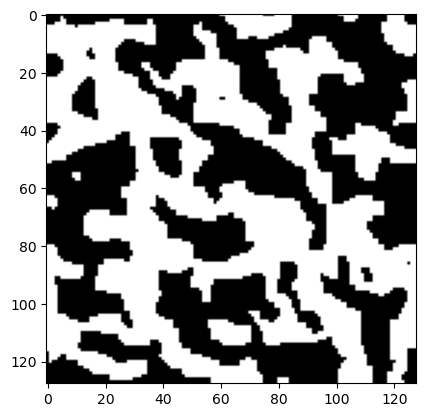

In [43]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= 20

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

#Q5
Which image minimizes the overall energy for this model?

#A5


#Q6
Change 𝛽 and give it a negative value. Describe the result and justify it.

<Figure size 640x480 with 0 Axes>

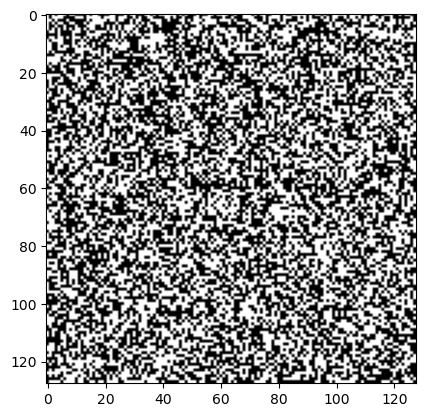

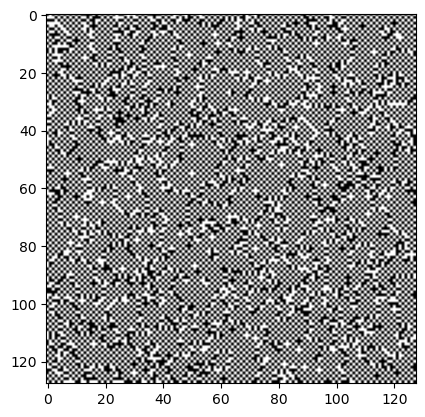

In [50]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= -1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

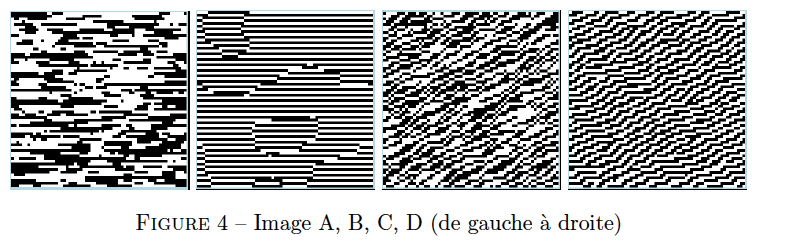

#Q7
We now work in 8-neighborhood, but still with cliques of order 2 (non-isotropic this time). For each of the following images, propose the clique potentials that allow us to obtain these realizations. Initially all clique potentials are zero.


* Image A : there is only one clique potential of order 2 which is -1.
* Image B : in addition to the previous one, there is a clique potential of order 2 which is 1. Indicate which one.
* Image C: in addition to the 2 previous ones, there is a clique potential of order 2 which is -1. Indicate which one.
* Image D: in addition to the 3 previous ones, there is a second order clique potential which is +1. Indicate which one.





In [101]:
def ising2(s, v, b):
    """
    @param s: value of this point
    @param v: value of chosen neighboring point
    @param b: beta
    @return: value of these two neighbors
    """
    if s == v:
        return b
    else:
        return 0

In [108]:
# here we define 4 connectivity
def echanA(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= ising2(0, im_bin[i][j1],-2) + ising2(0, im_bin[i][j2],-2)
#             Ureg0= ising(0, im_bin[i1][j],-2)
            p0=math.exp(-Ureg0);

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= ising2(1, im_bin[i][j1],-2) + ising2(1, im_bin[i][j2],-2)
#             Ureg1= ising(1, im_bin[i1][j],-2)
            p1=math.exp(-Ureg1);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0 # ?
                else :
                    im_bin[i,j]= 1 # ?

    return im_bin

<Figure size 640x480 with 0 Axes>

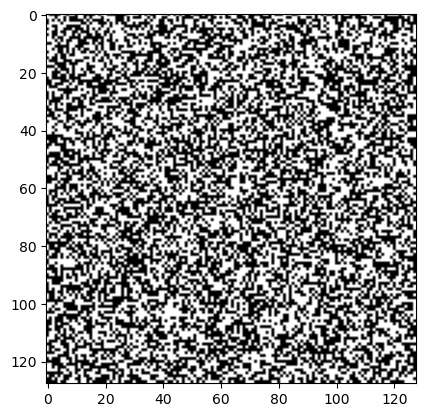

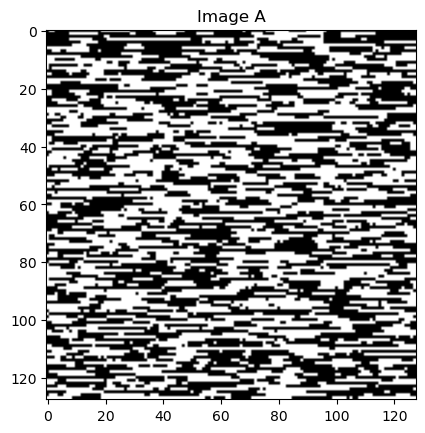

In [123]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
# im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= -1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echanA(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.title("Image A")
plt.show()

In [116]:
# here we define 4 connectivity
def echanB(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= ising2(0, im_bin[i][j1],-2) + ising2(0, im_bin[i][j2],-2) + ising2(0, im_bin[i1][j],2) + ising2(0, im_bin[i2][j],2)
            p0=math.exp(-Ureg0);

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= ising2(1, im_bin[i][j1],-2) + ising2(1, im_bin[i][j2],-2) + ising2(1, im_bin[i1][j],2) + ising2(1, im_bin[i2][j],2)
            p1=math.exp(-Ureg1);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0 # ?
                else :
                    im_bin[i,j]= 1 # ?

    return im_bin

<Figure size 640x480 with 0 Axes>

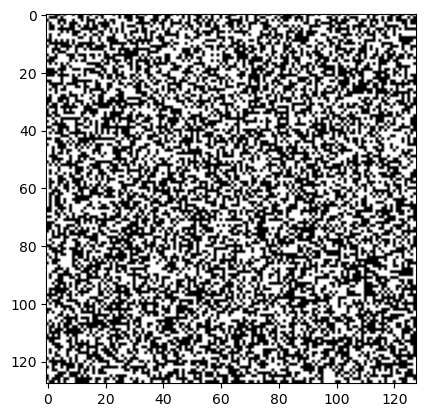

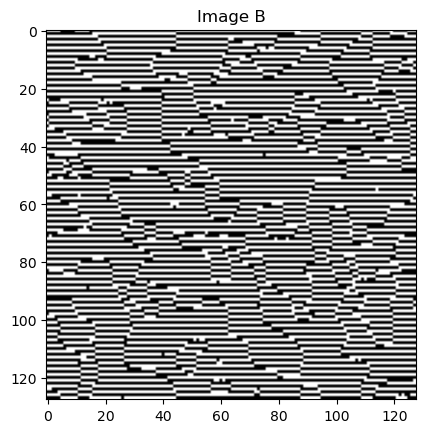

In [125]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
# im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= -1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echanB(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.title("Image B")
plt.imshow(im_bin)
plt.show()

In [133]:
# here we define 4 connectivity
def echanC(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= ising2(0, im_bin[i][j1],-2) + ising2(0, im_bin[i][j2],-2) + ising2(0, im_bin[i1][j],2) + ising2(0, im_bin[i2][j],2) + ising2(0, im_bin[i1][j2],-2) + ising2(0, im_bin[i2][j1],-2)
            p0=math.exp(-Ureg0);

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= ising2(1, im_bin[i][j1],-2) + ising2(1, im_bin[i][j2],-2) + ising2(1, im_bin[i1][j],2) + ising2(1, im_bin[i2][j],2) + ising2(1, im_bin[i1][j2],-2) + ising2(1, im_bin[i2][j1],-2)
            p1=math.exp(-Ureg1);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0 # ?
                else :
                    im_bin[i,j]= 1 # ?

    return im_bin

<Figure size 640x480 with 0 Axes>

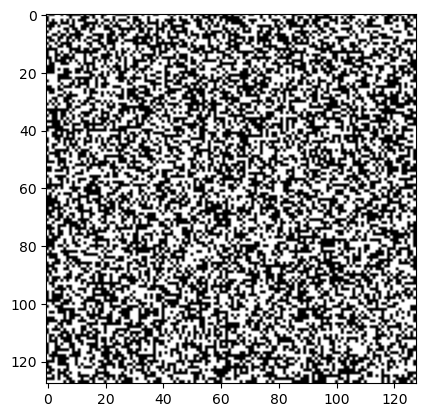

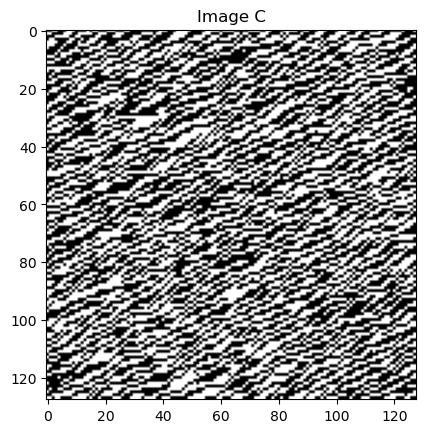

In [134]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
# im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= -1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echanC(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.title("Image C")
plt.show()

In [135]:
# here we define 4 connectivity
def echanD(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= ising2(0, im_bin[i][j1],-2) + ising2(0, im_bin[i][j2],-2) + ising2(0, im_bin[i1][j],2) + ising2(0, im_bin[i2][j],2) + ising2(0, im_bin[i1][j2],-2) + ising2(0, im_bin[i2][j1],-2) + ising2(0, im_bin[i1][j1],2) + ising2(0, im_bin[i2][j2],2)
            p0=math.exp(-Ureg0);

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= ising2(1, im_bin[i][j1],-2) + ising2(1, im_bin[i][j2],-2) + ising2(1, im_bin[i1][j],2) + ising2(1, im_bin[i2][j],2) + ising2(1, im_bin[i1][j2],-2) + ising2(1, im_bin[i2][j1],-2) + ising2(1, im_bin[i1][j1],2) + ising2(1, im_bin[i2][j2],2)
            p1=math.exp(-Ureg1);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0 # ?
                else :
                    im_bin[i,j]= 1 # ?

    return im_bin

<Figure size 640x480 with 0 Axes>

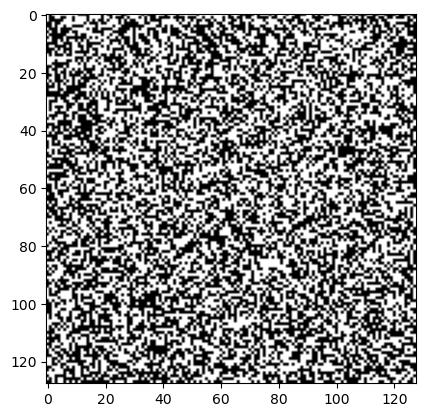

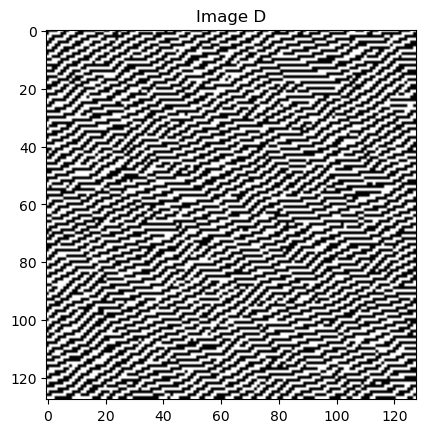

In [136]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
# im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= -1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echanD(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.title("Image D")
plt.show()

#A7


#Q8

Modify your program to define an Ising model with a diagonal attractive potential only (the other potentials are zero). It means that this model **encourages** similar labels (either 0 or 1) for neighboring pixels in the diagonal directions ($\pi/4$ or $3\pi/4$ directions). Comment on the result.

In [138]:
def echan_Ising(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0= ising(0, im_bin[i1][j1],2) + ising(0, im_bin[i2][j2],2) + ising2(0, im_bin[i1][j2],2) + ising2(0, im_bin[i2][j1],2)
            p0=math.exp(-Ureg0);

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1= ising(1, im_bin[i1][j1],2) + ising(1, im_bin[i2][j2],2) + ising2(1, im_bin[i1][j2],2) + ising2(1, im_bin[i2][j1],2)
            p1=math.exp(-Ureg1);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]= 0 # ?
                else :
                    im_bin[i,j]= 1 # ?

    return im_bin

<Figure size 640x480 with 0 Axes>

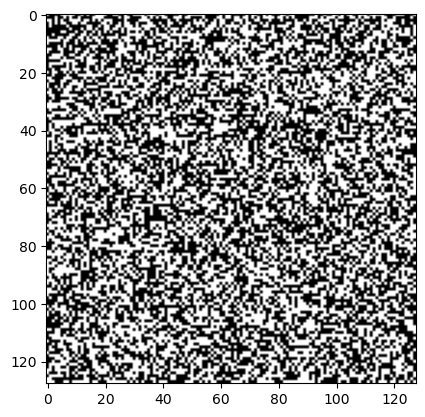

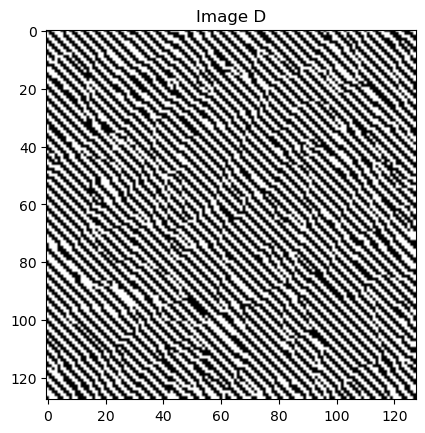

In [139]:
# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
# im_bin_copy = np.copy(im_bin)
# plt.imshow(im_bin)
beta_reg= -1

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan_Ising(im_bin,beta_reg)
#     plt.imshow(im_bin)
#     mafigure.canvas.draw()
#     plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.title("Image D")
plt.show()

#A8